In [1]:
# Strive2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import cv2

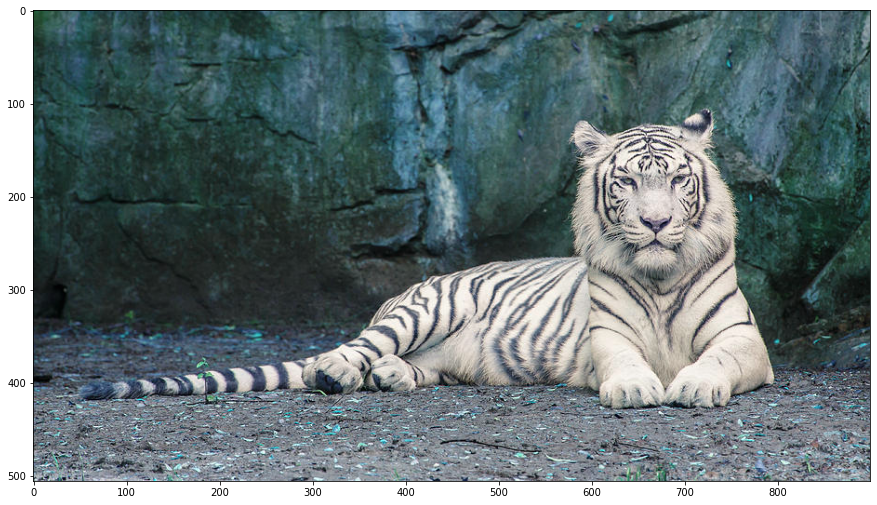

In [2]:
tiger = cv2.imread('images/tiger1.jpg')

plt.figure(figsize=(15,10))
plt.imshow(tiger)

## Blur Kernels

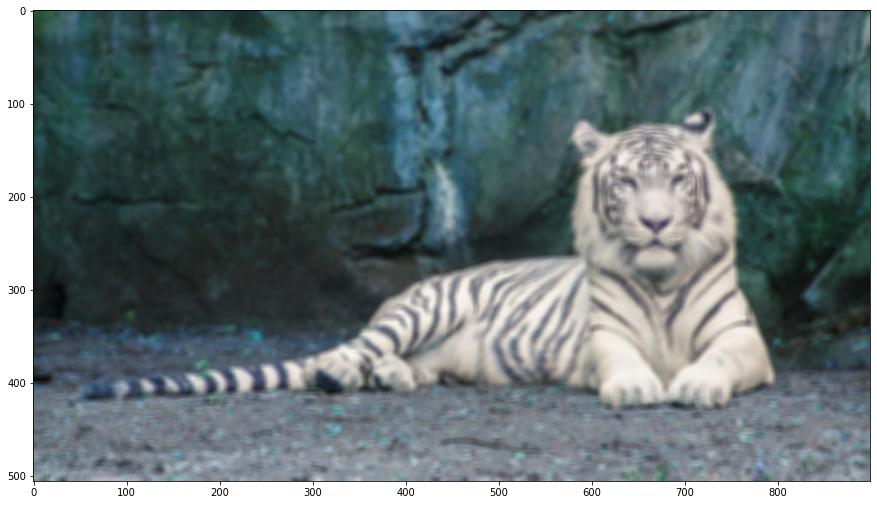

In [3]:
# must sum up to 1
blur_kernel = np.ones((7,7), np.float32) / 49

# -1=depth, -1 will be the same depth
blur_tiger = cv2.filter2D(tiger, -1, blur_kernel)

plt.figure(figsize=(15,10))
plt.imshow(blur_tiger)

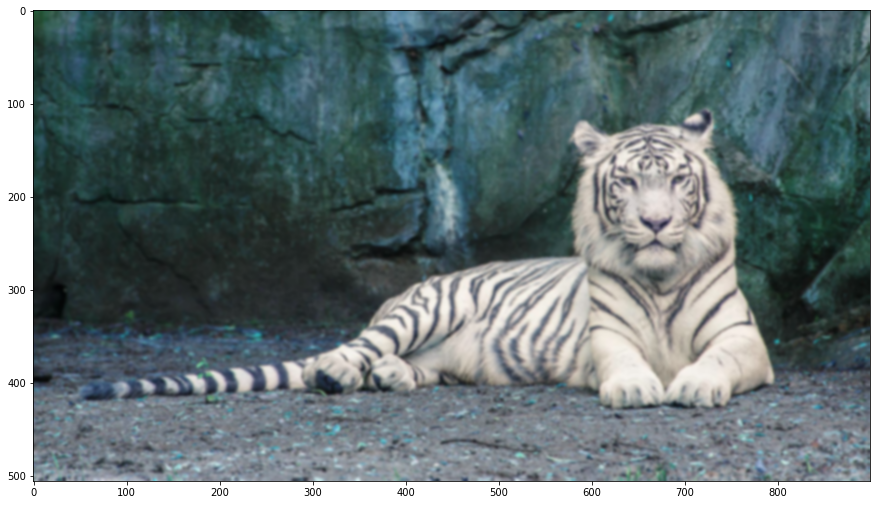

In [4]:
# (7,7) = kernel size
# 0 = deviation
gaussian_blur = cv2.GaussianBlur(tiger, (7,7), 0)

plt.figure(figsize=(15,10))
plt.imshow(gaussian_blur)

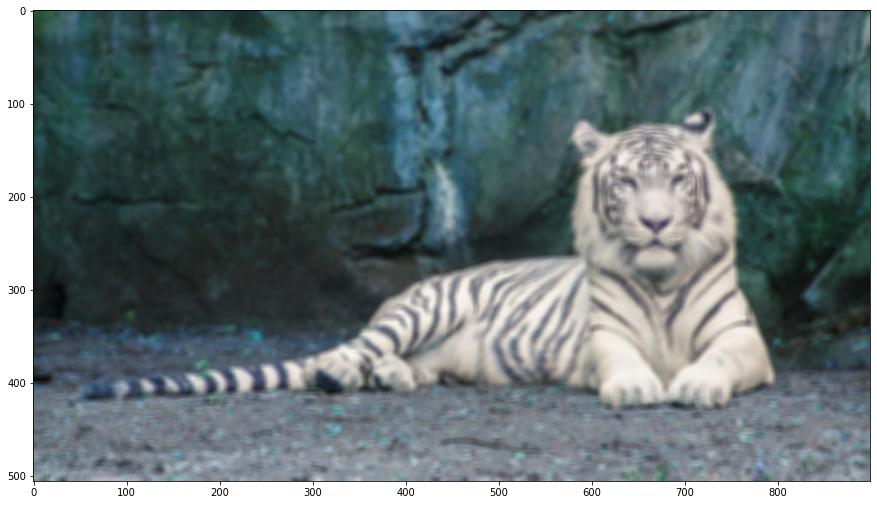

In [5]:
blur = cv2.blur(tiger, (7,7))
# similar to blur_kernel
plt.figure(figsize=(15,10))
plt.imshow(blur)

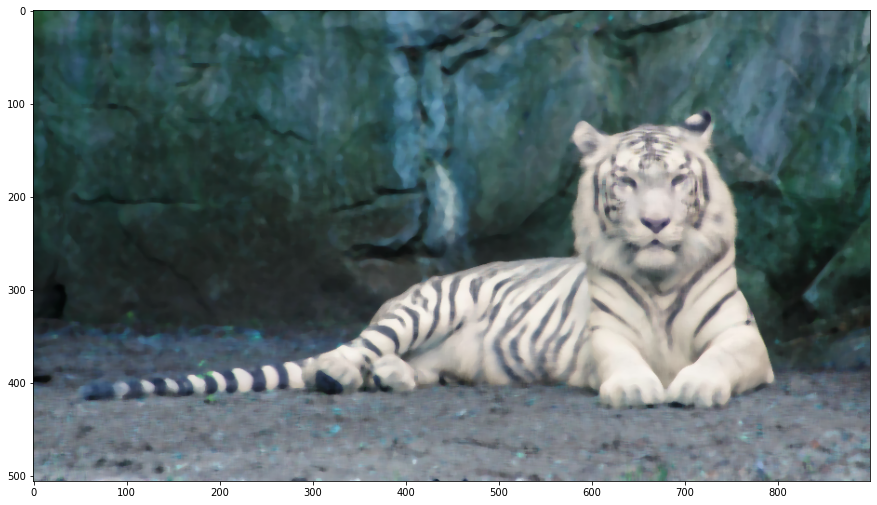

In [6]:
median_blur = cv2.medianBlur(tiger, 7)

plt.figure(figsize=(15,10))
plt.imshow(median_blur)

## Sharpening Kernels

In [7]:
sharp_kernel = np.ones((3,3), np.float32) * -1
sharp_kernel[1,1] = 9
sharp_kernel

array([[-1., -1., -1.],
       [-1.,  9., -1.],
       [-1., -1., -1.]], dtype=float32)

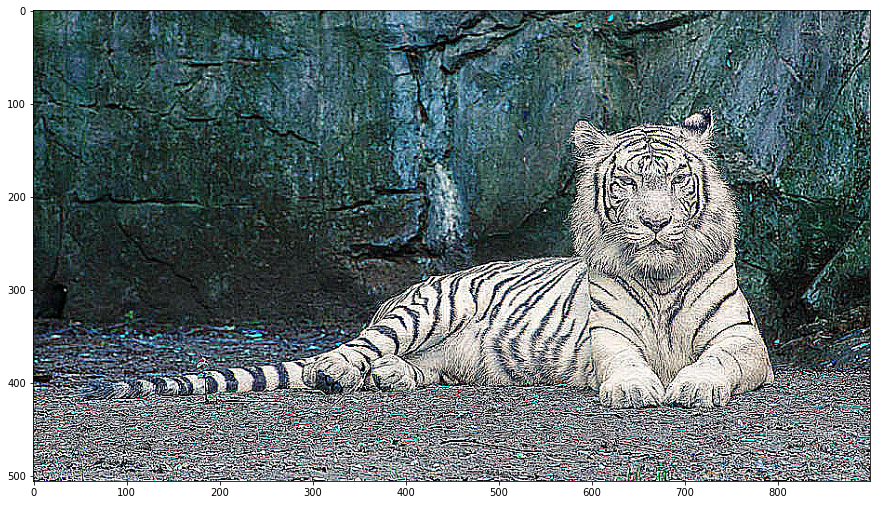

In [8]:
sharp_tiger = cv2.filter2D(tiger, -1, sharp_kernel)

plt.figure(figsize=(15,10))
plt.imshow(sharp_tiger)

## Edge Detection Kernels

In [9]:
edge_kernel = np.ones((3,3), np.float32) * -1
edge_kernel[1,1] = 8
edge_kernel

array([[-1., -1., -1.],
       [-1.,  8., -1.],
       [-1., -1., -1.]], dtype=float32)

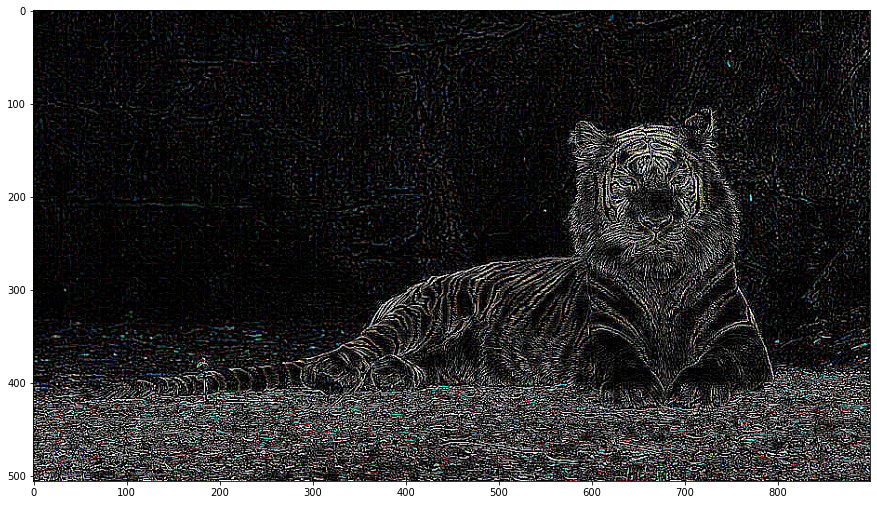

In [10]:
edge_tiger = cv2.filter2D(tiger, -1, edge_kernel)

plt.figure(figsize=(15,10))
plt.imshow(edge_tiger)

### 1. Sobel

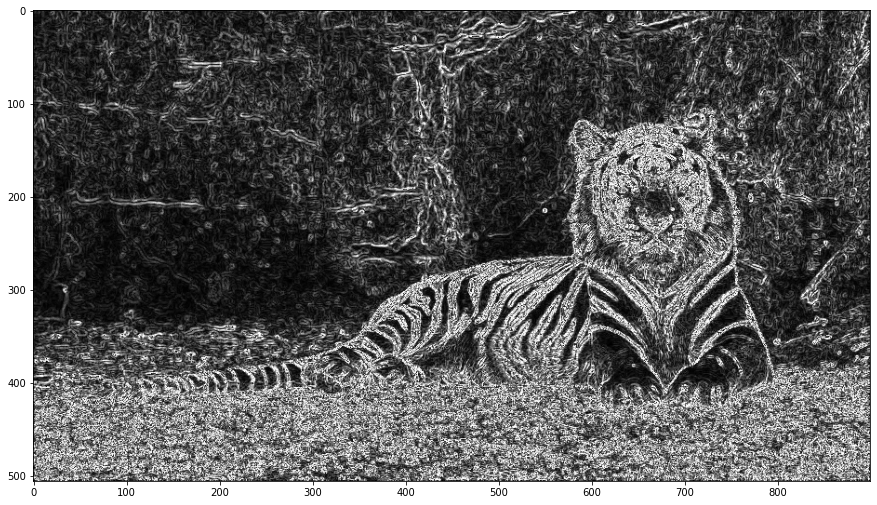

In [45]:
tiger = cv2.imread('images/tiger1.jpg', 0)

# generates an output image with the detected edges bright and darker background
# CV_8U = 8bit unsigned integer image
# ksize=3 default

sobel_tiger_x = cv2.Sobel(tiger, cv2.CV_8U, 1, 0) # 1, 0 for the x axis
sobel_tiger_y = cv2.Sobel(tiger, cv2.CV_8U, 0, 1) # 0, 1 for the y axis

# sobel_tiger_x = np.uint8(np.absolute(sobel_tiger_x))
# sobel_tiger_y = np.uint8(np.absolute(sobel_tiger_y))

sobel_combined = cv2.bitwise_or(sobel_tiger_x, sobel_tiger_y)

plt.figure(figsize=(15,10))
plt.imshow(sobel_combined, cmap='gray')

### 2. Laplacian

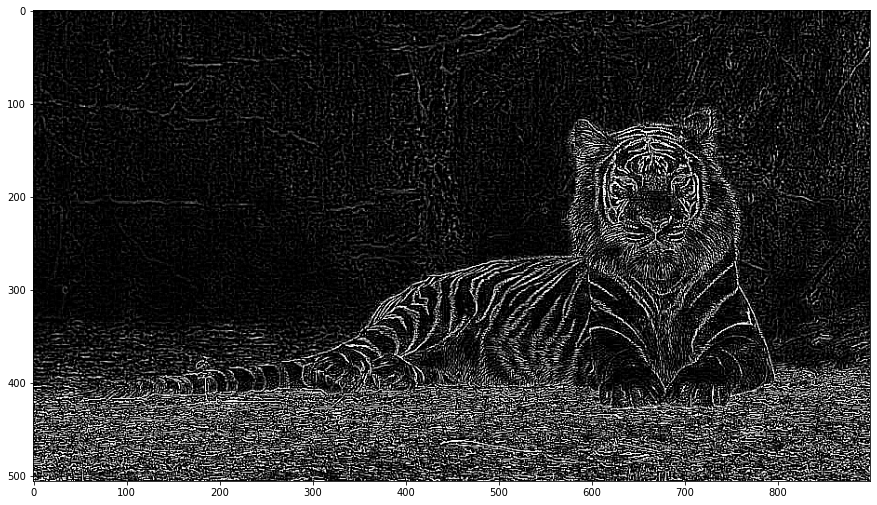

In [39]:
# removes noise by applying GaussianBlur and convert to grayscale

laplacian_tiger = cv2.Laplacian(tiger, cv2.CV_8U, ksize=3)
laplacian_tiger = np.uint8(np.absolute(laplacian_tiger))

plt.figure(figsize=(15,10))
plt.imshow(laplacian_tiger, cmap='gray')

### 3. Canny

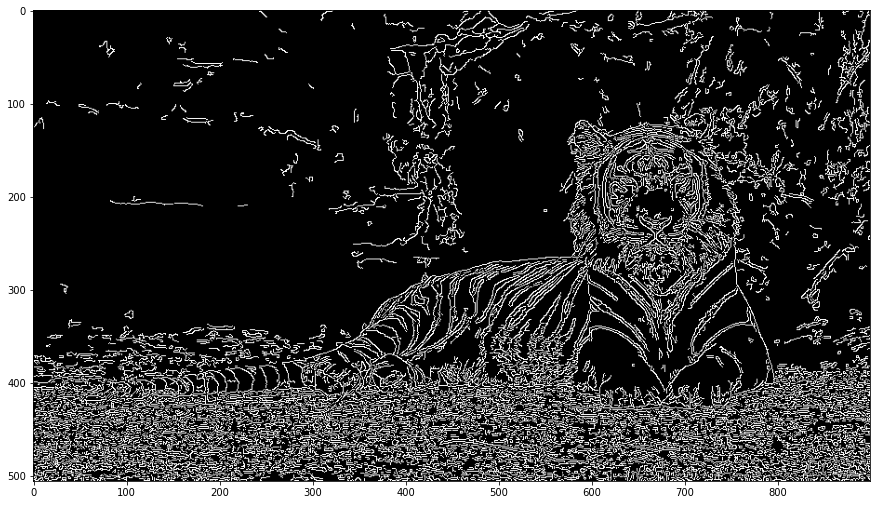

In [47]:
# applies GaussianBlur, 5x5 filter
# find intensity gradient, 
# removes pixels that are not edges, 
# applies 2 thresholds, 
# outputs a binary image

# 100, 200 = min, max values respectively
# 4th arg = aperture_size = 3 by default = odd number between 3 and 7 
# = size of the Sobel kernel used to find image gradients
# 5th arg = L2gradient = default is False
canny_tiger = cv2.Canny(tiger, 100, 200, apertureSize=3, L2gradient=False)

plt.figure(figsize=(15,10))
plt.imshow(canny_tiger, cmap='gray')

In [ ]:
def nothing(x):
    pass

cv2.namedWindow('Canny Trackbar')
cv2.createTrackbar('Threshold 1', 'Canny Trackbar', 0, 500, nothing)
cv2.createTrackbar('Threshold 2', 'Canny Trackbar', 0, 500, nothing)

while True:

    t1 = cv2.getTrackbarPos('Threshold 1', 'Canny Trackbar')
    t2 = cv2.getTrackbarPos('Threshold 2', 'Canny Trackbar')

    canny_tiger = cv2.Canny(tiger, t1, t2)

    cv2.imshow('Canny Tiger', canny_tiger)

    if cv2.waitKey(1) == ord('q'):
        break

cv2.destroyAllWindows()

### 4. All 3 compared

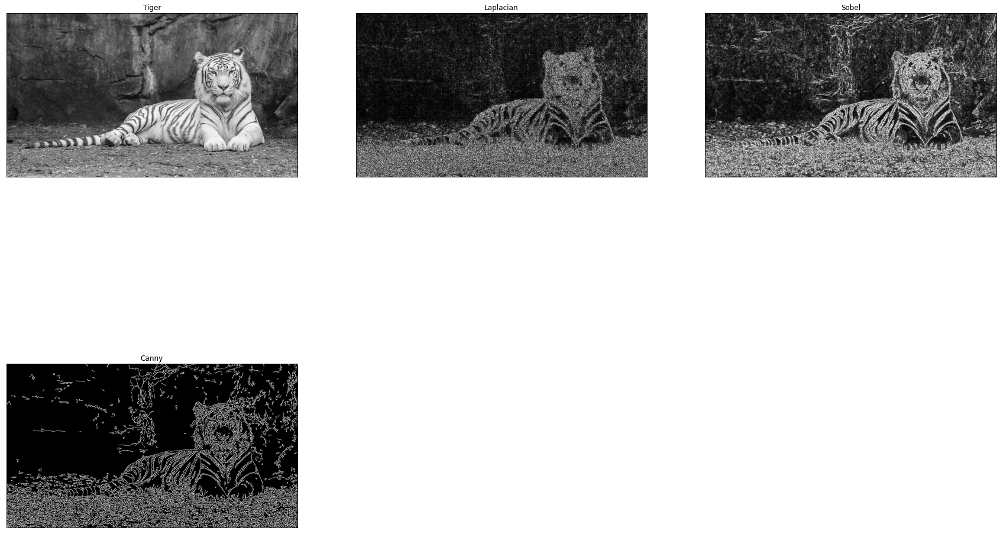

In [30]:
titles = ['Tiger', 'Laplacian', 'Sobel', 'Canny']
images = [tiger, laplacian_tiger, sobel_combined, canny_tiger]

plt.figure(figsize=(30,20))
for i in range(4):
    plt.subplot(2, 3, i+1)
    plt.imshow(images[i], 'gray')
    plt.title(titles[i])
    plt.xticks([]), plt.yticks([]) # no white background and ticks
    
plt.show()